# HackinSAS 2021

__Module:__ sound sampling, blending & visualization for preparation of training, testing & validation sets
    
__Author:__ Amir Hossini

__Date:__ March 3, 2021

#### Libraries

In [1]:
import os
import sys
import time
import pickle
import librosa
import numpy as np
import pandas as pd
from scipy import signal
import matplotlib.pyplot as plt
from scipy.io.wavfile import write
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

import IPython.display as ipd
sys.path.append('./src/')
from udfs_prep import chunk_data

%matplotlib inline
plt.rcParams.update({'figure.max_open_warning': 0})

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity='all'

#### Read and sample data

In [2]:
infl_emerg  = '../data/emerg.wav'
infl_nemerg = '../data/nonemerg.wav'

In [3]:
r_sample=16000

In [4]:
emerg,  sample_rate = librosa.load(infl_emerg , sr = r_sample)
nemerg, sample_rate = librosa.load(infl_nemerg, sr = r_sample)

### Training & Testing Set

In [5]:
subset_duration = 15 #in minutes
chunk_duration  = 5 #in seconds

In [6]:
emerg_sub=chunk_data(emerg[-subset_duration*r_sample*60:],chunk_duration,r_sample)
nmerg_sub=chunk_data(nemerg[-subset_duration*r_sample*60:],chunk_duration,r_sample)

In [ ]:
chunk_samples = [i for i in range(0,len(emerg_sub),50)] 
for chunk_sample in chunk_samples: 
    print('Emergency chunk {} for {} sec'.format(chunk_sample,chunk_duration))
    ipd.Audio(emerg_sub[chunk_sample],rate=r_sample)
    ax1=plt.figure(figsize=(14,4))
    ax1=plt.plot(np.linspace(0, chunk_duration, num=chunk_duration*r_sample),emerg_sub[chunk_sample])
    ax1=plt.title('Emergency chunk {} for {} sec'.format(chunk_sample,chunk_duration))
    ax1=plt.xlabel('Time')
    ax1=plt.ylabel('Amplitude')

    fig, ax = plt.subplots(1,1,figsize=(14,4))
    ax=plt.specgram(emerg_sub[chunk_sample], Fs=r_sample, cmap='inferno')
    ax=plt.title('Emergency chunk {} for {} sec'.format(chunk_sample,chunk_duration))
    ax=plt.ylabel('Freqs in Hz')
    
    print('Non emergency chunk {} for {} sec'.format(chunk_sample,chunk_duration))
    ipd.Audio(nmerg_sub[chunk_sample],rate=r_sample)
    ax2=plt.figure(figsize=(14,4))
    ax2=plt.plot(np.linspace(0, chunk_duration, num=chunk_duration*r_sample),nmerg_sub[chunk_sample])
    ax2=plt.title('Non emergency chunk {} for {} sec'.format(chunk_sample,chunk_duration))
    ax2=plt.xlabel('Time')
    ax2=plt.ylabel('Amplitude')

    fig, ax = plt.subplots(1,1,figsize=(14,4))
    ax=plt.specgram(nmerg_sub[chunk_sample], Fs=r_sample, cmap='inferno')
    ax=plt.title('Non emergency chunk{} for {} sec'.format(chunk_sample,chunk_duration))
    ax=plt.ylabel('Freqs in Hz')

In [8]:
X_sound = np.concatenate([nmerg_sub,emerg_sub])
y_labls = np.concatenate([np.zeros(len(nmerg_sub)),np.ones(len(emerg_sub))])

X_train, X_test, y_train, y_test = train_test_split(X_sound,y_labls,test_size=0.3,random_state=42,stratify=y_labls,shuffle=True)

In [9]:
X_train = X_train.reshape(len(X_train),-1,1)
X_test  = X_test.reshape(len(X_test),-1,1)

In [10]:
pickle.dump(X_train, open('../data/X_train.pkl', 'wb'))
pickle.dump(X_test, open('../data/X_test.pkl', 'wb'))
pickle.dump(y_train, open('../data/y_train.pkl', 'wb'))
pickle.dump(y_test, open('../data/y_test.pkl', 'wb'))

### Validation Set

#### Sampling Settings
__Interval_0:__ Non-emergency: 00:00 to 04:00 (total 240 seconds) from "nonemerg.wav" <br>
__Interval_1:__    Emeregency: 01:45 to 02:05 (total 20 seconds) from "emerg.wav" <br>
__Interval_2:__    Emeregency: 05:10 to 06:30 (total 80 seconds) from "emerg.wav" <br>

__Embedding:__ 00:00[Interval_0]---00:30[Interval_1]---00:50[Intreval_0]---01:50[Interval_2]---03:10[Interval_0]---04:00.


In [11]:
interval_0_start = 0   ; (interval_0_end) = 240
interval_1_start = 105 ; interval_1_end = 125 ; emb1 = 30
interval_2_start = 310 ; interval_2_end = 390 ; emb2 = 110

#### Check Intervals

In [12]:
if (interval_0_end>nemerg.shape[0]/r_sample)|(interval_1_end>emerg.shape[0]/r_sample)|(interval_2_end>emerg.shape[0]/r_sample):
    print('ERROR: Check your intervals')
    os._exit(00)

#### Sound Blending

In [13]:
interval_0 = nemerg[interval_0_start*r_sample:interval_0_end*r_sample]
interval_1 =  emerg[interval_1_start*r_sample:interval_1_end*r_sample]
interval_2 =  emerg[interval_2_start*r_sample:interval_2_end*r_sample]

emb_intval = interval_0
emb_intval[emb1*r_sample:emb1*r_sample+(interval_1_end-interval_1_start)*r_sample]=interval_1[:]
emb_intval[emb2*r_sample:emb2*r_sample+(interval_2_end-interval_2_start)*r_sample]=interval_2[:]

In [14]:
ipd.Audio(emb_intval,rate=r_sample)

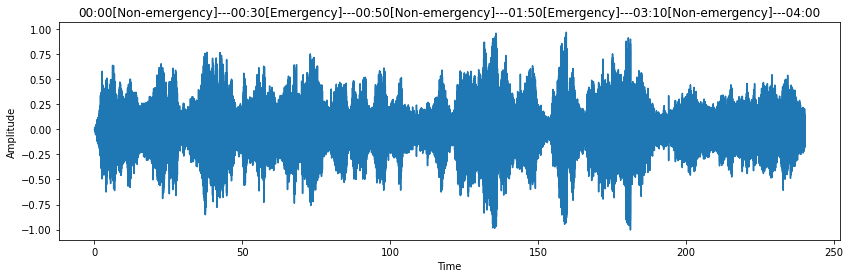

In [15]:
ax=plt.figure(figsize=(14,4))
ax=plt.plot(np.linspace(0, 240, num=240*r_sample),emb_intval)
ax=plt.title('00:00[Non-emergency]---00:30[Emergency]---00:50[Non-emergency]---01:50[Emergency]---03:10[Non-emergency]---04:00')
ax=plt.xlabel('Time')
ax=plt.ylabel('Amplitude')

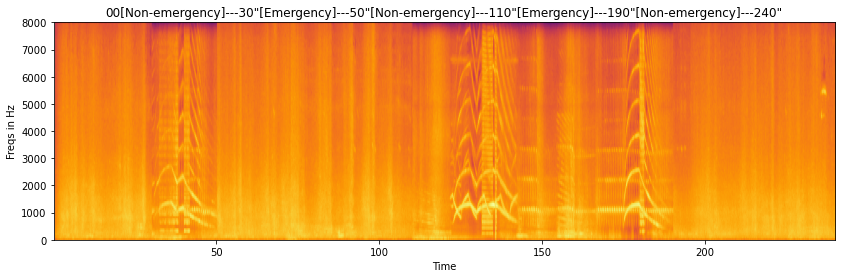

In [16]:
fig, ax = plt.subplots(1,1,figsize=(14,4))
ax=plt.specgram(emb_intval, Fs=r_sample, cmap='inferno')
ax=plt.title('00[Non-emergency]---30"[Emergency]---50"[Non-emergency]---110"[Emergency]---190"[Non-emergency]---240"')
ax=plt.xlabel('Time')
ax=plt.ylabel('Freqs in Hz')

In [17]:
write("../data/
      validation.wav", r_sample, emb_intval)